In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import warnings
warnings.simplefilter("ignore")
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/cardiovascular-diseases-risk-prediction-dataset/CVD_cleaned.csv


<h1>Final Conclusion Preview</h1>
<p style="font-size:20px; color:blue;">Below charts are a preview of the final results obtained by comparing five different versions of the ML approach(Four algorithms).<br>
In this notebook, we will cover this five different versions.
</p>

<div class="title">
    <img src="https://img1.daumcdn.net/thumb/R1280x0/?scode=mtistory2&fname=https%3A%2F%2Fblog.kakaocdn.net%2Fdn%2FdxrFIE%2FbtsHQKHvXxu%2FOm12LdHJpLEYmU6R7i6BHk%2Fimg.png" alt="Image">    
</div>

In [2]:
df = pd.read_csv('/kaggle/input/cardiovascular-diseases-risk-prediction-dataset/CVD_cleaned.csv')
df.head()

,General_Health,Checkup,Exercise,Heart_Disease,Skin_Cancer,Other_Cancer,Depression,Diabetes,Arthritis,Sex,Age_Category,Height_(cm),Weight_(kg),BMI,Smoking_History,Alcohol_Consumption,Fruit_Consumption,Green_Vegetables_Consumption,FriedPotato_Consumption
0,Poor,Within the past 2 years,No,No,No,No,No,No,Yes,Female,70-74,150.0,32.66,14.54,Yes,0.0,30.0,16.0,12.0
1,Very Good,Within the past year,No,Yes,No,No,No,Yes,No,Female,70-74,165.0,77.11,28.29,No,0.0,30.0,0.0,4.0
2,Very Good,Within the past year,Yes,No,No,No,No,Yes,No,Female,60-64,163.0,88.45,33.47,No,4.0,12.0,3.0,16.0
3,Poor,Within the past year,Yes,Yes,No,No,No,Yes,No,Male,75-79,180.0,93.44,28.73,No,0.0,30.0,30.0,8.0
4,Good,Within the past year,No,No,No,No,No,No,No,Male,80+,191.0,88.45,24.37,Yes,0.0,8.0,4.0,0.0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 308854 entries, 0 to 308853
Data columns (total 19 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   General_Health                308854 non-null  object 
 1   Checkup                       308854 non-null  object 
 2   Exercise                      308854 non-null  object 
 3   Heart_Disease                 308854 non-null  object 
 4   Skin_Cancer                   308854 non-null  object 
 5   Other_Cancer                  308854 non-null  object 
 6   Depression                    308854 non-null  object 
 7   Diabetes                      308854 non-null  object 
 8   Arthritis                     308854 non-null  object 
 9   Sex                           308854 non-null  object 
 10  Age_Category                  308854 non-null  object 
 11  Height_(cm)                   308854 non-null  float64
 12  Weight_(kg)                   308854 non-nul

In [4]:
df.nunique()

General_Health                     5
Checkup                            5
Exercise                           2
Heart_Disease                      2
Skin_Cancer                        2
Other_Cancer                       2
Depression                         2
Diabetes                           4
Arthritis                          2
Sex                                2
Age_Category                      13
Height_(cm)                       99
Weight_(kg)                      525
BMI                             3654
Smoking_History                    2
Alcohol_Consumption               31
Fruit_Consumption                 77
Green_Vegetables_Consumption      75
FriedPotato_Consumption           69
dtype: int64

# EDA & Data Preprocessing

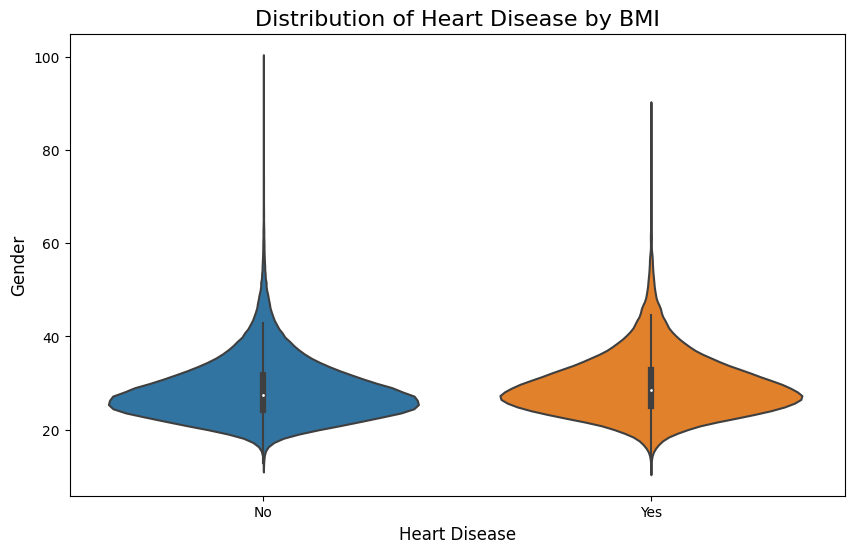

In [5]:
import plotly.graph_objs as go
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

plt.figure(figsize=(10, 6))
sns.violinplot(x='Heart_Disease', y='BMI', data=df)
plt.title('Distribution of Heart Disease by BMI', fontsize=16)
plt.xlabel('Heart Disease', fontsize=12)
plt.ylabel('Gender', fontsize=12)
plt.show()

In [6]:
def plotly_boxplot(df , numeric_types , color  , row = None) :
    def gather( df, key, value, cols ):
        id_vars = [ col for col in df.columns if col not in cols ]
        id_values = cols
        var_name = key
        value_name = value
        return pd.melt( df, id_vars, id_values, var_name, value_name )
    numeric_gather = gather( df , 'key', 'value', numeric_types )
    
    fig = px.box(numeric_gather, x="key", y="value",
                 facet_col="key" ,color = color , 
                 facet_row=row, width=800, height=500 )
    fig.update_yaxes(showticklabels=True , matches=None)
    fig.update_xaxes(showticklabels=True , matches=None)
    fig.show()

In [33]:
plotly_boxplot(df, ["General_Health"], "Heart_Disease")

In [8]:
plotly_boxplot(df, ["BMI"], "Heart_Disease")

In [9]:
plotly_boxplot(df, ["Alcohol_Consumption"], "Heart_Disease")

In [10]:
from sklearn import preprocessing 

df['Heart_Disease'] = df['Heart_Disease'].map({'Yes':1, 'No':0})

label_encoder = preprocessing.LabelEncoder()
df['Exercise'] = label_encoder.fit_transform(df['Exercise'])
df['Skin_Cancer'] = label_encoder.fit_transform(df['Skin_Cancer'])
df['Other_Cancer'] = label_encoder.fit_transform(df['Other_Cancer'])
df['Depression'] = label_encoder.fit_transform(df['Depression'])
df['Sex'] = label_encoder.fit_transform(df['Sex'])
df['Arthritis'] = label_encoder.fit_transform(df['Arthritis'])
df['Smoking_History'] = label_encoder.fit_transform(df['Smoking_History'])


df['General_Health'] = label_encoder.fit_transform(df['General_Health']) #Categorical Data?
df['Checkup'] = label_encoder.fit_transform(df['Checkup']) #Categorical Data?
df['Diabetes'] = label_encoder.fit_transform(df['Diabetes']) #Categorical Data?
df['Age_Category'] = label_encoder.fit_transform(df['Age_Category']) #Categorical Data?
df.head()

,General_Health,Checkup,Exercise,Heart_Disease,Skin_Cancer,Other_Cancer,Depression,Diabetes,Arthritis,Sex,Age_Category,Height_(cm),Weight_(kg),BMI,Smoking_History,Alcohol_Consumption,Fruit_Consumption,Green_Vegetables_Consumption,FriedPotato_Consumption
0,3,2,0,0,0,0,0,0,1,0,10,150.0,32.66,14.54,1,0.0,30.0,16.0,12.0
1,4,4,0,1,0,0,0,2,0,0,10,165.0,77.11,28.29,0,0.0,30.0,0.0,4.0
2,4,4,1,0,0,0,0,2,0,0,8,163.0,88.45,33.47,0,4.0,12.0,3.0,16.0
3,3,4,1,1,0,0,0,2,0,1,11,180.0,93.44,28.73,0,0.0,30.0,30.0,8.0
4,2,4,0,0,0,0,0,0,0,1,12,191.0,88.45,24.37,1,0.0,8.0,4.0,0.0


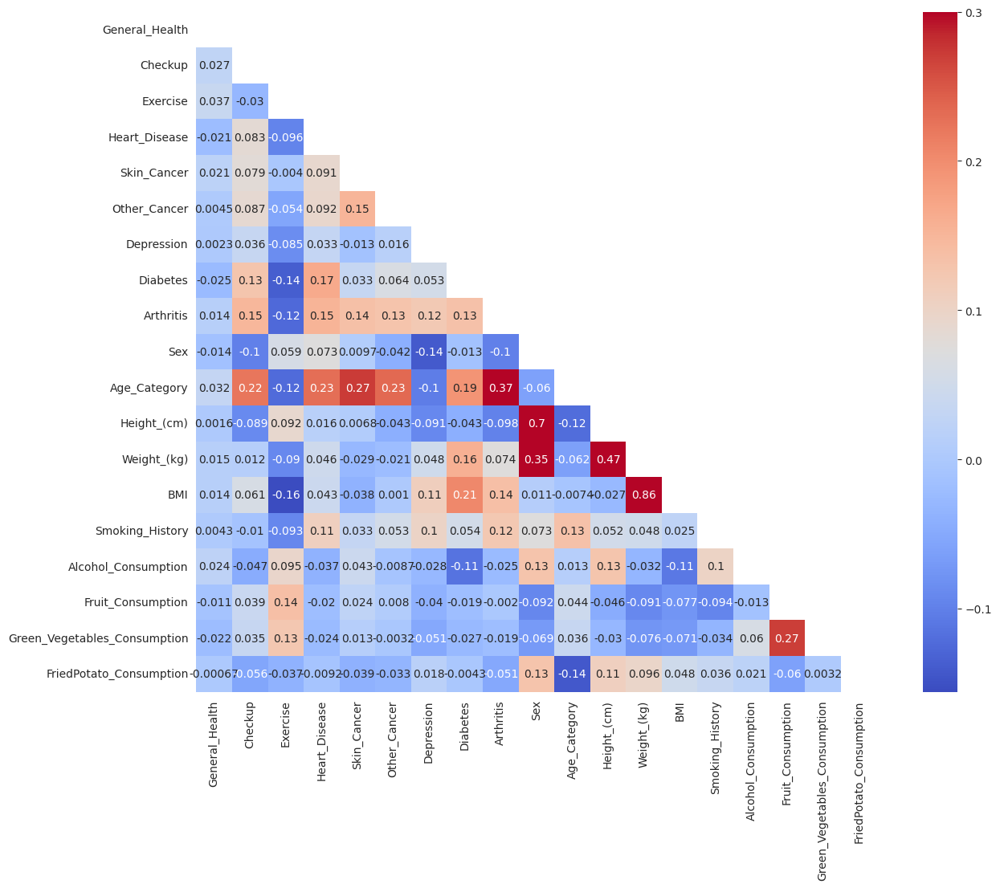

In [11]:
import plotly.graph_objs as go
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

def corr_vis(corr) :
    mask = np.zeros_like(corr)
    mask[np.triu_indices_from(mask)] = True
    with sns.axes_style("white"):
        f, ax = plt.subplots(figsize=(15, 11))
        g = sns.heatmap(corr, mask=mask, vmax=.3, square=True, annot=True, cmap='coolwarm')
        g.set_xticklabels(g.get_xticklabels(), rotation = 90, fontsize = 10)

corr_vis(df.corr())

In [12]:
X=df.drop(['Heart_Disease'],axis=1)
y=df['Heart_Disease']
X_MM = X
X_STD = X
X.describe()

,General_Health,Checkup,Exercise,Skin_Cancer,Other_Cancer,Depression,Diabetes,Arthritis,Sex,Age_Category,Height_(cm),Weight_(kg),BMI,Smoking_History,Alcohol_Consumption,Fruit_Consumption,Green_Vegetables_Consumption,FriedPotato_Consumption
count,308854.000000,308854.000000,308854.000000,308854.000000,308854.000000,308854.000000,308854.000000,308854.000000,308854.000000,308854.000000,308854.000000,308854.000000,308854.000000,308854.000000,308854.000000,308854.000000,308854.000000,308854.000000
mean,2.273278,3.515069,0.775062,0.097114,0.096738,0.200422,0.308159,0.327245,0.481321,6.535888,170.615249,83.588655,28.626211,0.405577,5.096366,29.835200,15.110441,6.296616
std,1.494109,1.019576,0.417542,0.296113,0.295602,0.400316,0.724383,0.469208,0.499652,3.523526,10.658026,21.343210,6.522323,0.491004,8.199763,24.875735,14.926238,8.582954
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,91.000000,24.950000,12.020000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,4.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,163.000000,68.040000,24.210000,0.000000,0.000000,12.000000,4.000000,2.000000
50%,2.000000,4.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.000000,170.000000,81.650000,27.440000,0.000000,1.000000,30.000000,12.000000,4.000000
75%,4.000000,4.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,9.000000,178.000000,95.250000,31.850000,1.000000,6.000000,30.000000,20.000000,8.000000
max,4.000000,4.000000,1.000000,1.000000,1.000000,1.000000,3.000000,1.000000,1.000000,12.000000,241.000000,293.020000,99.330000,1.000000,30.000000,120.000000,128.000000,128.000000


# Comparison1. Standard Scaler vs MinMax Scaler

In [13]:
from sklearn.preprocessing import StandardScaler
features = ['General_Health','Checkup','Exercise',
            'Skin_Cancer','Other_Cancer','Depression',
            'Diabetes','Arthritis','Sex',
            'Age_Category','Height_(cm)','Weight_(kg)',
            'BMI','Smoking_History','Alcohol_Consumption',
            'Fruit_Consumption','Green_Vegetables_Consumption','FriedPotato_Consumption']

standard_scaler=StandardScaler()
X_STD[features]=standard_scaler.fit_transform(X_STD[features])
X_STD.describe()

,General_Health,Checkup,Exercise,Skin_Cancer,Other_Cancer,Depression,Diabetes,Arthritis,Sex,Age_Category,Height_(cm),Weight_(kg),BMI,Smoking_History,Alcohol_Consumption,Fruit_Consumption,Green_Vegetables_Consumption,FriedPotato_Consumption
count,3.088540e+05,3.088540e+05,3.088540e+05,3.088540e+05,3.088540e+05,3.088540e+05,3.088540e+05,3.088540e+05,3.088540e+05,3.088540e+05,3.088540e+05,3.088540e+05,3.088540e+05,3.088540e+05,3.088540e+05,3.088540e+05,3.088540e+05,3.088540e+05
mean,1.406113e-16,-5.378752e-17,1.001212e-16,-2.503029e-17,-1.619607e-17,5.484578e-17,1.067468e-17,4.269873e-17,-6.699283e-17,1.155810e-16,-5.860032e-16,2.120213e-16,-1.192666e-15,-8.318890e-17,-6.257572e-17,5.742243e-17,-5.769850e-17,5.374150e-17
std,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00
min,-1.521497e+00,-3.447585e+00,-1.856251e+00,-3.279624e-01,-3.272596e-01,-5.006586e-01,-4.254089e-01,-6.974423e-01,-9.633150e-01,-1.854931e+00,-7.469993e+00,-2.747419e+00,-2.546062e+00,-8.260163e-01,-6.215270e-01,-1.199372e+00,-1.012342e+00,-7.336199e-01
25%,-8.522003e-01,4.756216e-01,5.387201e-01,-3.279624e-01,-3.272596e-01,-5.006586e-01,-4.254089e-01,-6.974423e-01,-9.633150e-01,-7.197029e-01,-7.145095e-01,-7.285071e-01,-6.770928e-01,-8.260163e-01,-6.215270e-01,-7.169729e-01,-7.443576e-01,-5.005995e-01
50%,-1.829040e-01,4.756216e-01,5.387201e-01,-3.279624e-01,-3.272596e-01,-5.006586e-01,-4.254089e-01,-6.974423e-01,-9.633150e-01,1.317184e-01,-5.772641e-02,-9.083253e-02,-1.818696e-01,-8.260163e-01,-4.995721e-01,6.624922e-03,-2.083878e-01,-2.675792e-01
75%,1.155689e+00,4.756216e-01,5.387201e-01,-3.279624e-01,-3.272596e-01,-5.006586e-01,-4.254089e-01,1.433810e+00,1.038082e+00,6.993327e-01,6.928828e-01,5.463735e-01,4.942709e-01,1.210630e+00,1.102026e-01,6.624922e-03,3.275820e-01,1.984616e-01
max,1.155689e+00,4.756216e-01,5.387201e-01,3.049130e+00,3.055679e+00,1.997369e+00,3.716053e+00,1.433810e+00,1.038082e+00,1.550754e+00,6.603931e+00,9.812567e+00,1.084029e+01,1.210630e+00,3.037121e+00,3.624614e+00,7.563174e+00,1.417968e+01


In [14]:
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from lightgbm import LGBMClassifier

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
def get_clf_eval(y_test, pred):
    acc = accuracy_score(y_test, pred)
    pre = precision_score(y_test, pred)
    re = recall_score(y_test, pred)
    f1 = f1_score(y_test, pred)
    auc = roc_auc_score(y_test, pred)
    
    return acc, pre, re, f1, auc

def get_result(model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    pred = model.predict(X_test)

    return get_clf_eval(y_test, pred)

def get_result_pd(models, model_names, X_train, y_train, X_test, y_test):
    col_names = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
    tmp = []
    
    for model in models:
        tmp.append(get_result(model, X_train, y_train, X_test, y_test))
    
    return pd.DataFrame(tmp, columns=col_names, index=model_names)

In [15]:
# MimMax Scaler
X_train, X_test, y_train, y_test = train_test_split(X_MM, y, test_size=0.2, stratify=y)

lr_clf = LogisticRegression(random_state=13, solver='liblinear')
dt_clf = DecisionTreeClassifier(random_state=13, max_depth=4)
rf_clf = RandomForestClassifier(random_state=13, n_jobs=-1, n_estimators=100)
lgbm_clf = LGBMClassifier(n_estimators=1000, num_leaves=64, n_jobs=-1, boost_from_average=False, force_row_wise=True)

models = [lr_clf, dt_clf, rf_clf, lgbm_clf]
model_names = ['LinearReg', 'DecisionTree', 'RandomForest', 'LightGBM']

comp1_mm_results = get_result_pd(models, model_names, X_train, y_train, X_test, y_test)
comp1_mm_results

[LightGBM] [Info] Number of positive: 19977, number of negative: 227106
[LightGBM] [Info] Total Bins 843
[LightGBM] [Info] Number of data points in the train set: 247083, number of used features: 18


,accuracy,precision,recall,f1,roc_auc
LinearReg,0.918845,0.465455,0.025631,0.048586,0.511521
DecisionTree,0.919153,0.000000,0.000000,0.000000,0.500000
RandomForest,0.918667,0.456140,0.031237,0.058471,0.513981
LightGBM,0.917939,0.445887,0.061874,0.108669,0.527555


In [16]:
# Standard Scaler
X_train, X_test, y_train, y_test = train_test_split(X_STD, y, test_size=0.2, stratify=y)

lr_clf = LogisticRegression(random_state=13, solver='liblinear')
dt_clf = DecisionTreeClassifier(random_state=13, max_depth=4)
rf_clf = RandomForestClassifier(random_state=13, n_jobs=-1, n_estimators=100)
lgbm_clf = LGBMClassifier(n_estimators=1000, num_leaves=64, n_jobs=-1, boost_from_average=False, force_row_wise=True)

models = [lr_clf, dt_clf, rf_clf, lgbm_clf]
model_names = ['LinearReg', 'DecisionTree', 'RandomForest', 'LightGBM']

comp1_std_results = get_result_pd(models, model_names, X_train, y_train, X_test, y_test)
comp1_std_results

[LightGBM] [Info] Number of positive: 19977, number of negative: 227106
[LightGBM] [Info] Total Bins 846
[LightGBM] [Info] Number of data points in the train set: 247083, number of used features: 18


,accuracy,precision,recall,f1,roc_auc
LinearReg,0.918473,0.428082,0.025030,0.047295,0.511044
DecisionTree,0.919153,0.000000,0.000000,0.000000,0.500000
RandomForest,0.918845,0.470948,0.030837,0.057884,0.513895
LightGBM,0.918068,0.447410,0.057068,0.101225,0.525434


> # Comparison1 Result
<div style="border-radius: 10px; border: #DBC4F0 solid; padding: 15px; background-color: #ffffff00; font-size: 19px; text-align: left;">
    📊 <b>Result:</b> There was no significant difference in performance between the two scalers. 
</div>  


# Comparison2. With Outlier Removal

IQR :  1.1713636778509138
lower bound :  -2.4341382680641805
upper bound :  2.251316443339475
# of Outlier :  9530


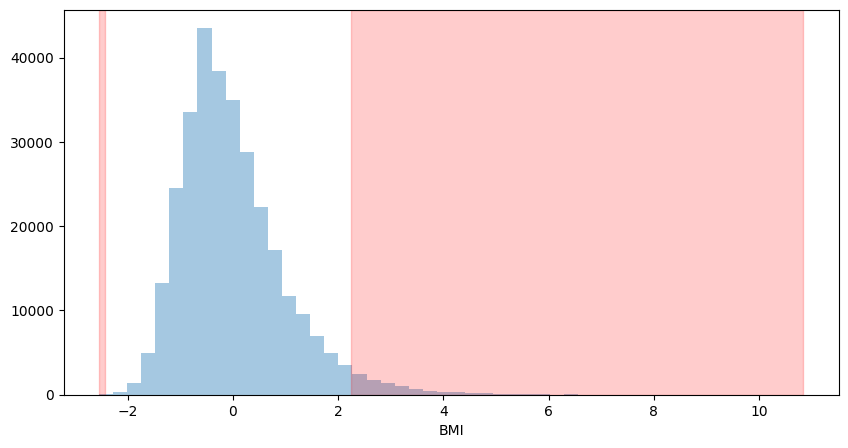

IQR :  0.6990611356687015
lower bound :  -1.549191232559408
upper bound :  1.2470533101153982
# of Outlier :  19456


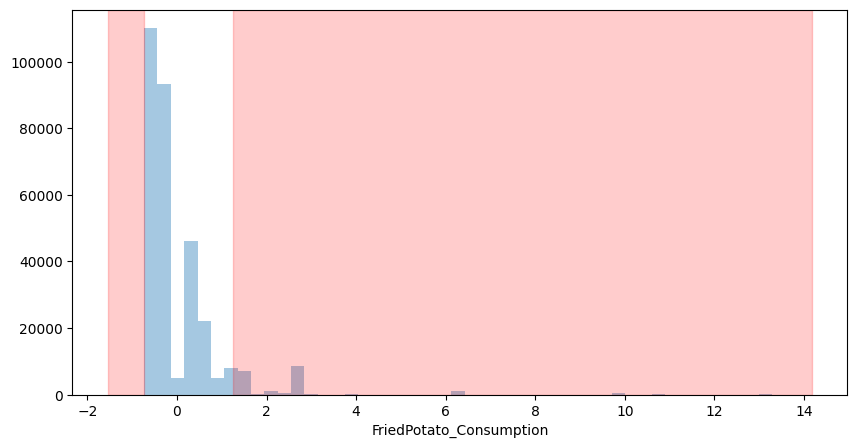

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter("ignore")


def draw_outlier_hist(data, column): 
    
    global lower, upper    
    q25, q75 = np.quantile(data[column], 0.25), np.quantile(data[column], 0.75)          
    iqr = q75 - q25    
    cut_off = iqr * 1.5          
    lower, upper = q25 - cut_off, q75 + cut_off     
    
    print('IQR : ',iqr)     
    print('lower bound : ', lower)     
    print('upper bound : ', upper)    
    
    data1 = data[data[column] > upper]     
    data2 = data[data[column] < lower]    
    
    print('# of Outlier : ', data1.shape[0] + data2.shape[0])
    
    plt.figure(figsize=(10,5))
    sns.distplot(data[column], kde=False)
    plt.axvspan(xmin=lower, xmax=data[column].min(), alpha=0.2, color='red')
    plt.axvspan(xmin=upper, xmax=data[column].max(), alpha=0.2, color='red')
    plt.show()
    
    return
    
draw_outlier_hist(X_STD,'BMI')
draw_outlier_hist(X_STD,'FriedPotato_Consumption')

In [18]:
# Outlier Removal
features = ['General_Health','Checkup','Diabetes',
            'Age_Category','Height_(cm)','Weight_(kg)',
            'BMI','Alcohol_Consumption','Fruit_Consumption',
            'Green_Vegetables_Consumption','FriedPotato_Consumption']


Q1 = df[features].quantile(0.25)
Q3 = df[features].quantile(0.75)
IQR = Q3 - Q1
outlier = df[((df[features] < (Q1 - 1.5 * IQR)) | (df[features] > (Q3 + 1.5 * IQR))).any(axis=1)]
df1 = df[~((df[features] < (Q1 - 1.5 * IQR)) | (df[features] > (Q3 + 1.5 * IQR))).any(axis=1)]

In [19]:
outlier.shape

(193778, 19)

In [20]:
df1.shape

(115076, 19)

In [21]:
df1.head()

,General_Health,Checkup,Exercise,Heart_Disease,Skin_Cancer,Other_Cancer,Depression,Diabetes,Arthritis,Sex,Age_Category,Height_(cm),Weight_(kg),BMI,Smoking_History,Alcohol_Consumption,Fruit_Consumption,Green_Vegetables_Consumption,FriedPotato_Consumption
4,2,4,0,0,0,0,0,0,0,1,12,191.0,88.45,24.37,1,0.0,8.0,4.0,0.0
6,1,4,1,1,0,0,0,0,1,1,8,175.0,69.85,22.74,1,0.0,16.0,8.0,0.0
7,2,4,1,0,0,0,0,0,1,0,9,165.0,108.86,39.94,1,3.0,30.0,8.0,8.0
8,1,4,0,0,0,0,1,0,0,0,9,163.0,72.57,27.46,1,0.0,12.0,12.0,4.0
10,1,4,1,1,0,0,0,0,1,0,11,160.0,74.84,29.23,0,0.0,30.0,20.0,2.0


In [22]:
X=df1.drop(['Heart_Disease'],axis=1)
y=df1['Heart_Disease']

scaler_std = StandardScaler()
X_train_scaled = scaler_std.fit_transform(X_train)
X_test_scaled = scaler_std.transform(X_test)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y)

In [23]:
lr_clf = LogisticRegression(random_state=13, solver='liblinear')
dt_clf = DecisionTreeClassifier(random_state=13, max_depth=4)
rf_clf = RandomForestClassifier(random_state=13, n_jobs=-1, n_estimators=100)
lgbm_clf = LGBMClassifier(n_estimators=1000, num_leaves=64, n_jobs=-1, boost_from_average=False, force_row_wise=True)

models = [lr_clf, dt_clf, rf_clf, lgbm_clf]
model_names = ['LinearReg', 'DecisionTree', 'RandomForest', 'LightGBM']

comp2_results = get_result_pd(models, model_names, X_train, y_train, X_test, y_test)
comp2_results

[LightGBM] [Info] Number of positive: 6987, number of negative: 85073
[LightGBM] [Info] Total Bins 644
[LightGBM] [Info] Number of data points in the train set: 92060, number of used features: 16


,accuracy,precision,recall,f1,roc_auc
LinearReg,0.924053,0.483871,0.008586,0.016873,0.503917
DecisionTree,0.924096,0.000000,0.000000,0.000000,0.500000
RandomForest,0.923097,0.346667,0.014883,0.028540,0.506289
LightGBM,0.920273,0.343972,0.055524,0.095614,0.523413


> # Comparison2 Result
<div style="border-radius: 10px; border: #DBC4F0 solid; padding: 15px; background-color: #ffffff00; font-size: 19px; text-align: left;">
    📊 <b>Result:</b> In comparison 2, while accuracy increased by approximately 3%, there was not a significant upgrade in AUC performance.
</div>  


# Comparision3. with Oversampling

In [24]:
X=df.drop(['Heart_Disease'],axis=1)
y=df['Heart_Disease']
X.shape

(308854, 18)

In [25]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_balanced, y_balanced = smote.fit_resample(X, y)

X_train, X_test, y_train, y_test = train_test_split(X_balanced, y_balanced, test_size=0.3, random_state=42)

scaler_d = StandardScaler()
X_train_scaled = scaler_d.fit_transform(X_train)
X_test_scaled = scaler_d.transform(X_test)

In [26]:
lr_clf = LogisticRegression(random_state=13, solver='liblinear')
dt_clf = DecisionTreeClassifier(random_state=13, max_depth=4)
rf_clf = RandomForestClassifier(random_state=13, n_jobs=-1, n_estimators=100)
lgbm_clf = LGBMClassifier(n_estimators=1000, num_leaves=64, n_jobs=-1, boost_from_average=False, force_row_wise=True)

models = [lr_clf, dt_clf, rf_clf, lgbm_clf]
model_names = ['LinearReg', 'DecisionTree', 'RandomForest', 'LightGBM']

comp3_results = get_result_pd(models, model_names, X_train_scaled, y_train, X_test_scaled, y_test)
comp3_results

[LightGBM] [Info] Number of positive: 198624, number of negative: 198812
[LightGBM] [Info] Total Bins 1836
[LightGBM] [Info] Number of data points in the train set: 397436, number of used features: 18


,accuracy,precision,recall,f1,roc_auc
LinearReg,0.751694,0.742814,0.770816,0.756556,0.751673
DecisionTree,0.783074,0.752014,0.845412,0.795982,0.783005
RandomForest,0.927517,0.927557,0.927644,0.927600,0.927517
LightGBM,0.949615,0.983090,0.915082,0.947868,0.949654


> # Comparison3 Result
<div style="border-radius: 10px; border: #DBC4F0 solid; padding: 15px; background-color: #ffffff00; font-size: 19px; text-align: left;">
    📊 <b>Result:</b> In Comparison 3, the utilization of oversampling techniques resulted in performance enhancements for both accuracy and AUC, with a significant boost seen in AUC performance.
</div>  


# Final Version. Oversampling x Outlier Removal

In [27]:
# Outlier Removal
features = ['General_Health','Checkup','Diabetes','Age_Category','Height_(cm)','Weight_(kg)','BMI','Alcohol_Consumption','Fruit_Consumption','Green_Vegetables_Consumption','FriedPotato_Consumption']
#features = ['General_Health','Checkup','Exercise','Skin_Cancer','Other_Cancer','Depression','Diabetes','Arthritis','Sex','Age_Category','Height_(cm)','Weight_(kg)','BMI','Smoking_History','Alcohol_Consumption','Fruit_Consumption','Green_Vegetables_Consumption','FriedPotato_Consumption']

Q1 = df[features].quantile(0.25)
Q3 = df[features].quantile(0.75)
IQR = Q3 - Q1
outlier = df[((df[features] < (Q1 - 1.5 * IQR)) | (df[features] > (Q3 + 1.5 * IQR))).any(axis=1)]
df1 = df[~((df[features] < (Q1 - 1.5 * IQR)) | (df[features] > (Q3 + 1.5 * IQR))).any(axis=1)]

In [28]:
X=df1.drop(['Heart_Disease'],axis=1)
y=df1['Heart_Disease']
X.shape

(115076, 18)

In [29]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)
X_balanced, y_balanced = smote.fit_resample(X, y)

X_train, X_test, y_train, y_test = train_test_split(X_balanced, y_balanced, test_size=0.3, random_state=42)

scaler_d = StandardScaler()
X_train_scaled = scaler_d.fit_transform(X_train)
X_test_scaled = scaler_d.transform(X_test)

In [30]:
lr_clf = LogisticRegression(random_state=13, solver='liblinear')
dt_clf = DecisionTreeClassifier(random_state=13, max_depth=4)
rf_clf = RandomForestClassifier(random_state=13, n_jobs=-1, n_estimators=100)
lgbm_clf = LGBMClassifier(n_estimators=1000, num_leaves=64, n_jobs=-1, boost_from_average=False, force_row_wise=True)

models = [lr_clf, dt_clf, rf_clf, lgbm_clf]
model_names = ['LinearReg', 'DecisionTree', 'RandomForest', 'LightGBM']

final_results = get_result_pd(models, model_names, X_train_scaled, y_train, X_test_scaled, y_test)
final_results

[LightGBM] [Info] Number of positive: 74400, number of negative: 74478
[LightGBM] [Info] Total Bins 1822
[LightGBM] [Info] Number of data points in the train set: 148878, number of used features: 16


,accuracy,precision,recall,f1,roc_auc
LinearReg,0.749773,0.738476,0.774404,0.756013,0.749743
DecisionTree,0.772529,0.754885,0.807964,0.780523,0.772486
RandomForest,0.936589,0.938865,0.934162,0.936507,0.936592
LightGBM,0.954973,0.984499,0.924613,0.953617,0.955010


> # Final Version Result
<div style="border-radius: 10px; border: #DBC4F0 solid; padding: 15px; background-color: #ffffff00; font-size: 19px; text-align: left;">
    📊 <b>Result:</b> Through the application of oversampling and outlier removal techniques, it demonstrated the highest performance in terms of accuracy and AUC across all aspects.
</div>  


# Conclusion

In [31]:
accuracy_result = pd.DataFrame({'Comp1(MinMax Scaler)' : comp1_mm_results['accuracy']*100,'Comp1(STD Scaler)' : comp1_std_results['accuracy']*100,
                               'Comp2(w/OutlierRemoval)' : comp2_results['accuracy']*100, 'Comp3(w/Oversampling)' : comp3_results['accuracy']*100, 'Final(ORxOS)' : final_results['accuracy']*100}).T

f1_result = pd.DataFrame({'Comp1(MinMax Scaler)' : comp1_mm_results['f1']*100,'Comp1(STD Scaler)' : comp1_std_results['f1']*100,
                               'Comp2(w/OutlierRemoval)' : comp2_results['f1']*100, 'Comp3(w/Oversampling)' : comp3_results['f1']*100, 'Final(ORxOS)' : final_results['f1']*100}).T

auc_result = pd.DataFrame({'Comp1(MinMax Scaler)' : comp1_mm_results['roc_auc']*100,'Comp1(STD Scaler)' : comp1_std_results['roc_auc']*100,
                               'Comp2(w/OutlierRemoval)' : comp2_results['roc_auc']*100, 'Comp3(w/Oversampling)' : comp3_results['roc_auc']*100, 'Final(ORxOS)' : final_results['roc_auc']*100}).T

auc_result

,LinearReg,DecisionTree,RandomForest,LightGBM
Comp1(MinMax Scaler),51.152084,50.000000,51.398076,52.755547
Comp1(STD Scaler),51.104435,50.000000,51.389500,52.543439
Comp2(w/OutlierRemoval),50.391694,50.000000,50.628942,52.341282
Comp3(w/Oversampling),75.167264,78.300515,92.751703,94.965361
Final(ORxOS),74.974260,77.248586,93.659201,95.501005


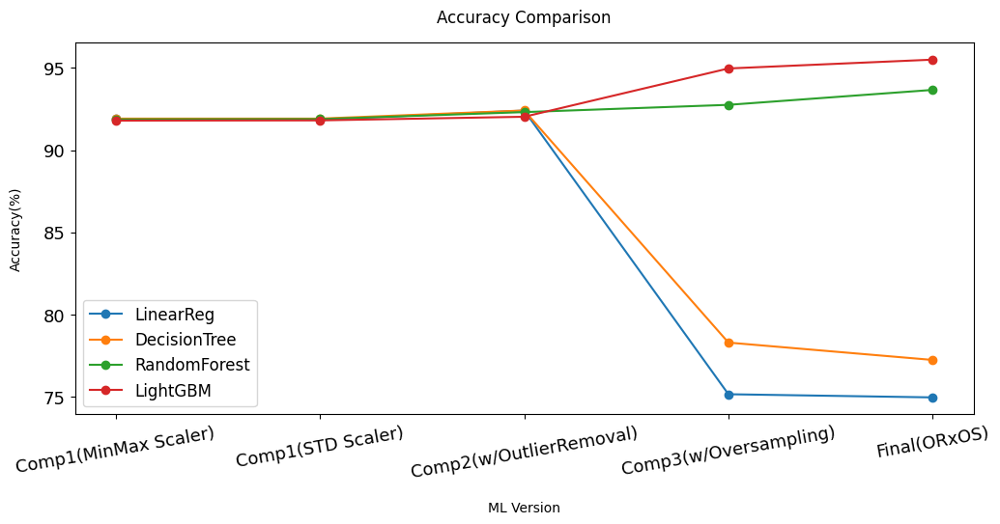

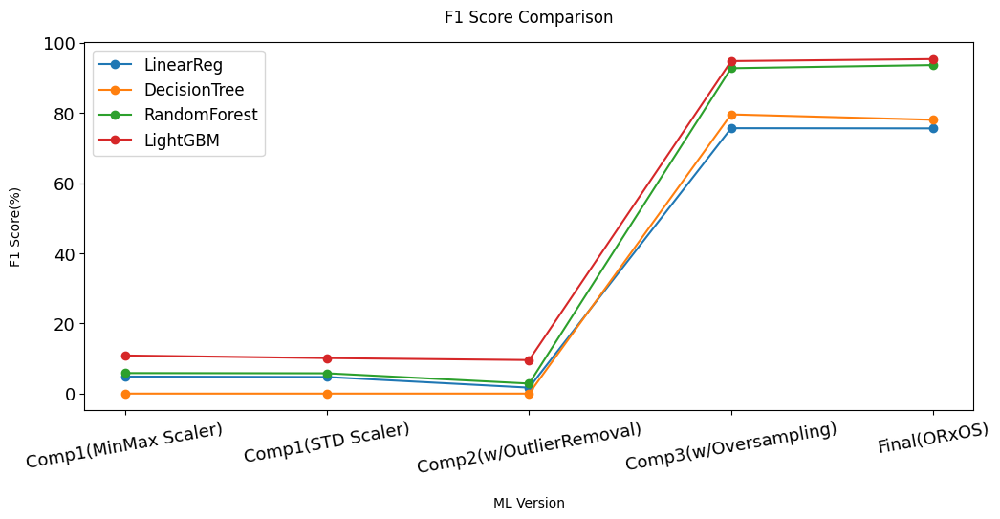

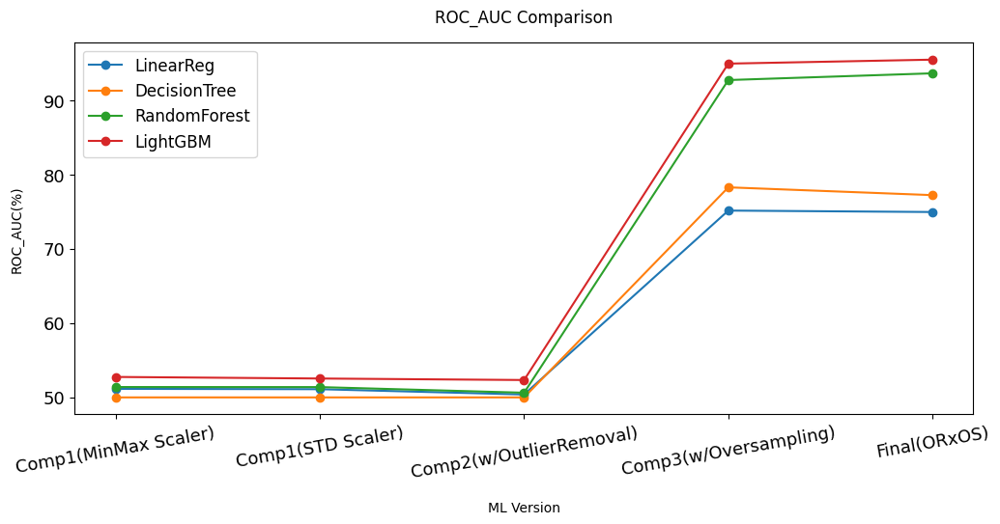

In [32]:
def draw_figure(df, title, metric):
    plt.figure(figsize=(12,5))
    result_col = df.columns.to_list()

    plt.plot(df, marker='o', label=result_col)
    plt.xlabel('ML Version', labelpad=15)
    plt.xticks(fontsize=13,rotation=10)
    plt.ylabel(metric+'(%)', labelpad=15)
    plt.yticks(fontsize=13)
    plt.title(metric+' Comparison', pad=15)
    plt.legend(fontsize=12)
    plt.show()
    
draw_figure(accuracy_result, "Accuracy Comparison", "Accuracy")
draw_figure(f1_result, "F1 Score Comparison", "F1 Score")
draw_figure(auc_result, "ROC_AUC Comparison", "ROC_AUC")